In [16]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [31]:
import torch
import torch.nn as nn
from torchsummary import summary
import os
import torch.optim as optim
from torchvision import transforms, datasets
from torch.utils.data import DataLoader
from PIL import Image
from torch.utils.data import Dataset
import numpy as np
import torchvision
from torchvision.utils import save_image
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

In [32]:
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

print('Using device:', device)
print()

Using device: cpu



In [33]:
train_path = '/content/drive/MyDrive/DL_ASSIGN_05/HCM/train'
test_path = '/content/drive/MyDrive/DL_ASSIGN_05/HCM/test'
val_path = '/content/drive/MyDrive/DL_ASSIGN_05/HCM/val'

In [34]:
class CustomImageDataset(Dataset):
    def __init__(self, path, transform=None):
        self.path = path
        self.image_list = os.listdir(path)
        self.transform = transform

    def __len__(self):
        return len(self.image_list)

    def __getitem__(self, idx):
        image_path = os.path.join(self.path, self.image_list[idx])
        image = Image.open(image_path).convert('RGB')

        if self.transform:
            image = self.transform(image)
        return image

In [35]:
transform = transforms.Compose([
    transforms.Resize((32,32)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

In [36]:
# Define hyperparameters
num_epochs = 5
batch_size = 100
lr = 0.0002
beta1 = 0.5
beta2 = 0.999


In [37]:
train = CustomImageDataset(path=train_path, transform=transform)
train_loader = DataLoader(train, batch_size=batch_size, shuffle=True)
test = CustomImageDataset(path=test_path, transform=transform)
test_loader = DataLoader(test, batch_size=batch_size, shuffle=True)
val = CustomImageDataset(path=val_path, transform=transform)
val_loader = DataLoader(val, batch_size=batch_size, shuffle=True)


In [38]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.discriminator = nn.Sequential(

            nn.Conv2d(3,32, 4,2, padding=1, bias=False),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2, inplace=True),


            nn.Conv2d(32, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),


            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),


            nn.Conv2d(128, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.discriminator(x)


In [39]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.generator = nn.Sequential(

            nn.ConvTranspose2d(100, 128, 4, 1, 0, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(128, 64, 4, 2,1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(64, 32, 4, 2, 1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(32, 3,4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.generator(x)



In [40]:
disc = Discriminator()
gen = Generator()

# Define the optimizers for discriminator and generator
optimizer_discriminator = optim.Adam(disc.parameters(), lr=lr, betas=(beta1, beta2))
optimizer_generator = optim.Adam(gen.parameters(), lr=lr, betas=(beta1, beta2))

# Binary Cross Entropy Loss function
criterion = nn.BCELoss()

In [41]:
# generator = Generator()
# input_size = (100,1,1)
# summary(generator, input_size)

In [42]:
# # Initialization of weights as mentioned in paper with mean 0 and std 0.02
# def initialize_weights(m):
#   if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
#       init.normal_(m.weight.data, 0.0, 0.02)
#       if m.bias is not None:
#           init.constant_(m.bias.data, 0)
#   elif isinstance(m, nn.BatchNorm2d):
#       init.normal_(m.weight.data, 1.0, 0.02)
#       init.constant_(m.bias.data, 0)


Epoch [0/5], Batch [0/9], Discriminator Loss: 1.4308, Generator Loss: 0.9465 on Training Dataset


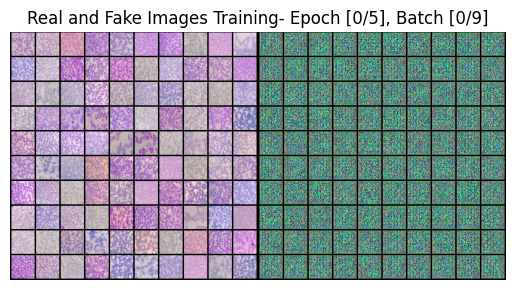

Epoch [0/5], Batch [1/9], Discriminator Loss: 1.2534, Generator Loss: 0.9701 on Training Dataset


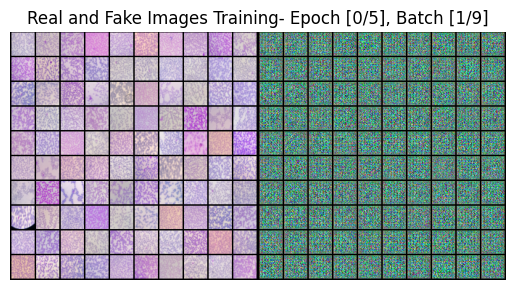

Epoch [0/5], Batch [2/9], Discriminator Loss: 1.1747, Generator Loss: 0.9534 on Training Dataset


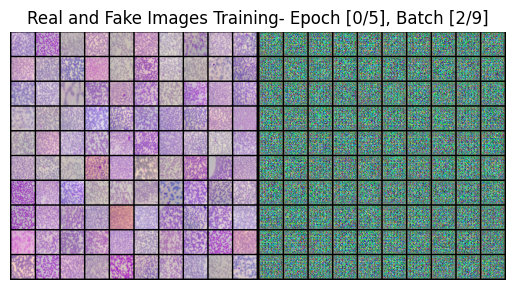

Epoch [0/5], Batch [3/9], Discriminator Loss: 1.0771, Generator Loss: 1.0210 on Training Dataset


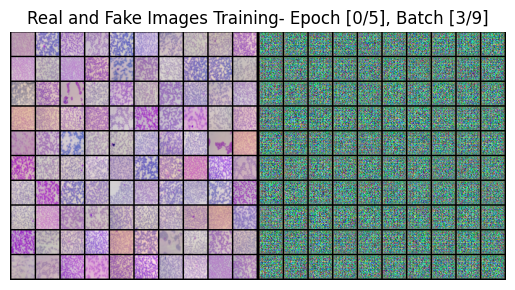

Epoch [0/5], Batch [4/9], Discriminator Loss: 0.9665, Generator Loss: 1.1100 on Training Dataset


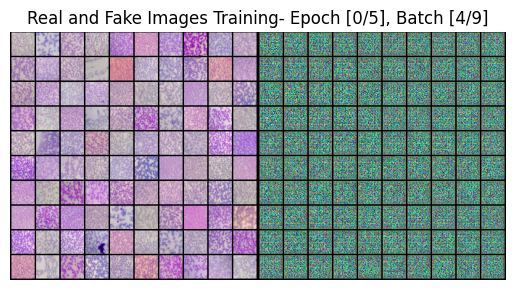

Epoch [0/5], Batch [5/9], Discriminator Loss: 0.8196, Generator Loss: 1.2652 on Training Dataset


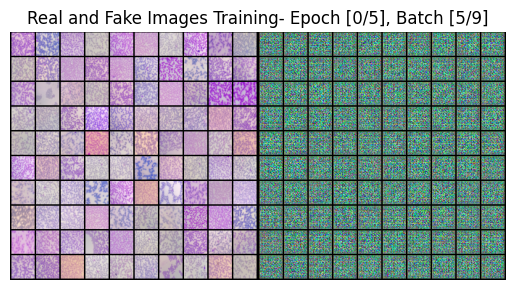

Epoch [0/5], Batch [6/9], Discriminator Loss: 0.7743, Generator Loss: 1.3764 on Training Dataset


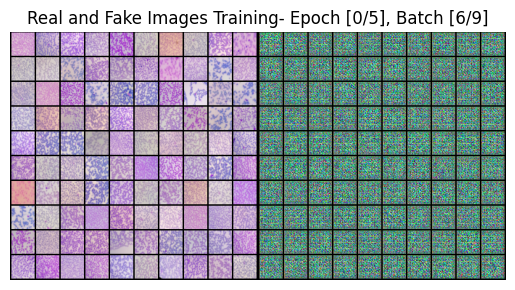

Epoch [0/5], Batch [7/9], Discriminator Loss: 0.6875, Generator Loss: 1.4520 on Training Dataset


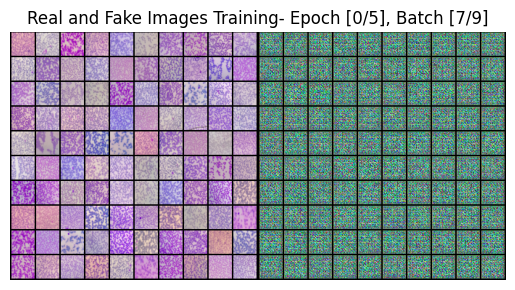

Epoch [0/5], Batch [8/9], Discriminator Loss: 0.6392, Generator Loss: 1.5730 on Training Dataset


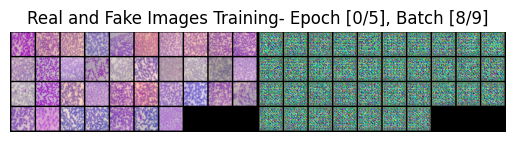

Epoch [0/5], Batch [0/1], Discriminator Loss: 1.3724, Generator Loss: 0.8956 on Validation Dataset


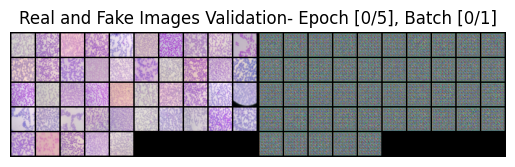

Epoch [1/5], Batch [0/9], Discriminator Loss: 1.3643, Generator Loss: 1.0300 on Training Dataset


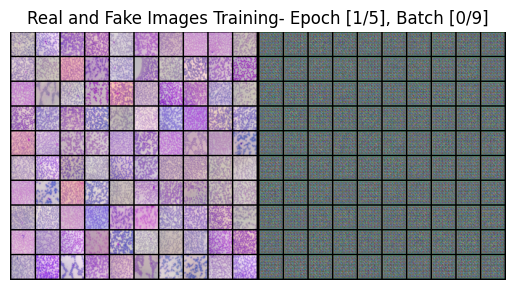

Epoch [1/5], Batch [1/9], Discriminator Loss: 1.0626, Generator Loss: 1.2157 on Training Dataset


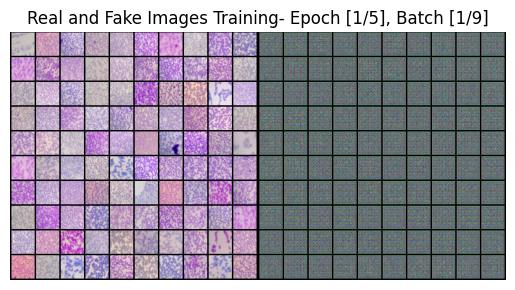

Epoch [1/5], Batch [2/9], Discriminator Loss: 0.7764, Generator Loss: 1.4516 on Training Dataset


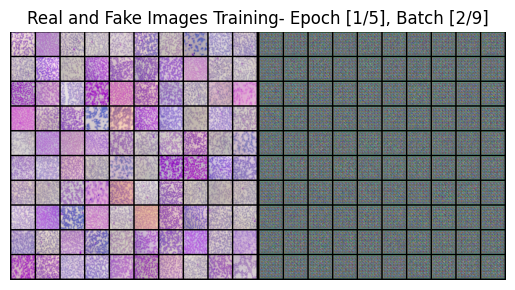

Epoch [1/5], Batch [3/9], Discriminator Loss: 0.5582, Generator Loss: 1.7262 on Training Dataset


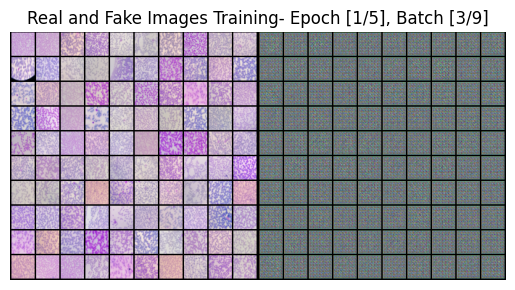

Epoch [1/5], Batch [4/9], Discriminator Loss: 0.3808, Generator Loss: 2.0202 on Training Dataset


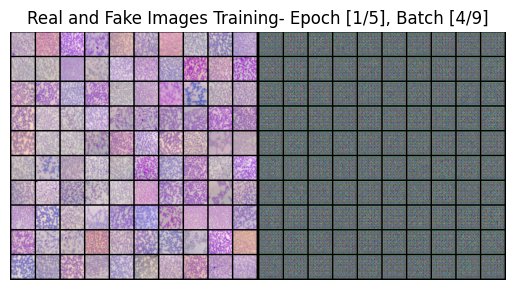

Epoch [1/5], Batch [5/9], Discriminator Loss: 0.2617, Generator Loss: 2.3162 on Training Dataset


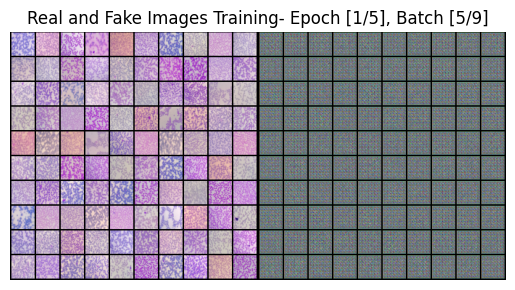

Epoch [1/5], Batch [6/9], Discriminator Loss: 0.1804, Generator Loss: 2.5869 on Training Dataset


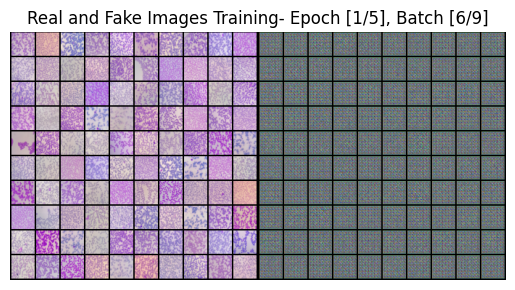

Epoch [1/5], Batch [7/9], Discriminator Loss: 0.1332, Generator Loss: 2.8178 on Training Dataset


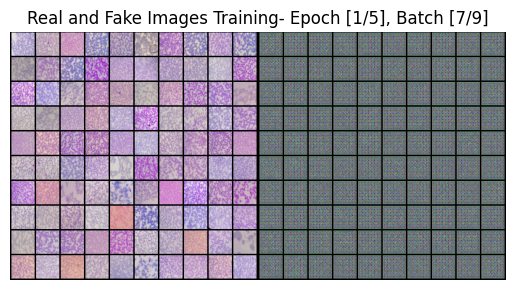

Epoch [1/5], Batch [8/9], Discriminator Loss: 0.0960, Generator Loss: 2.9988 on Training Dataset


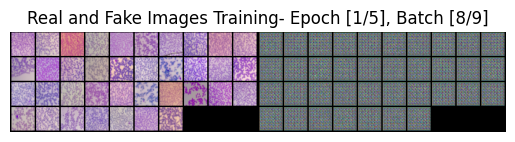

Epoch [1/5], Batch [0/1], Discriminator Loss: 0.0812, Generator Loss: 2.8525 on Validation Dataset


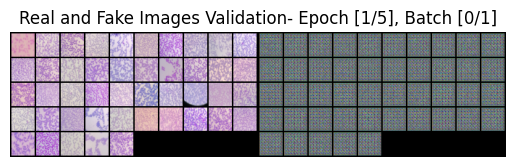

Epoch [2/5], Batch [0/9], Discriminator Loss: 0.0829, Generator Loss: 3.1137 on Training Dataset


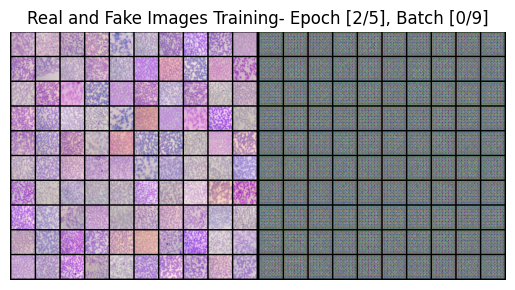

Epoch [2/5], Batch [1/9], Discriminator Loss: 0.0753, Generator Loss: 3.1705 on Training Dataset


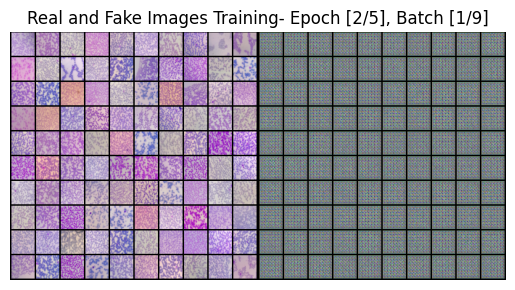

Epoch [2/5], Batch [2/9], Discriminator Loss: 0.0730, Generator Loss: 3.1496 on Training Dataset


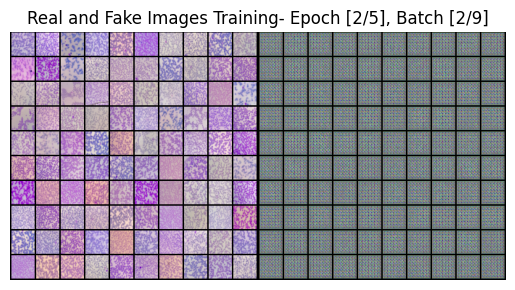

Epoch [2/5], Batch [3/9], Discriminator Loss: 0.0787, Generator Loss: 3.0468 on Training Dataset


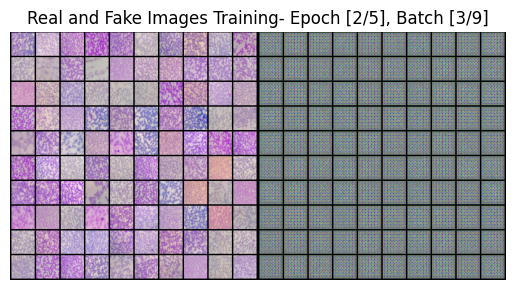

Epoch [2/5], Batch [4/9], Discriminator Loss: 0.0885, Generator Loss: 2.9099 on Training Dataset


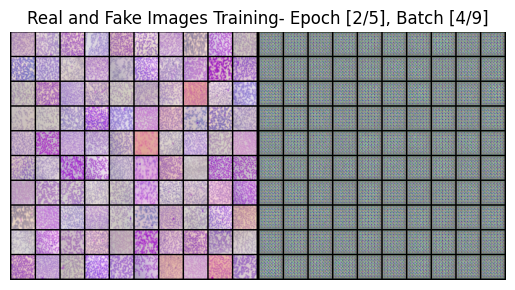

Epoch [2/5], Batch [5/9], Discriminator Loss: 0.1109, Generator Loss: 2.7583 on Training Dataset


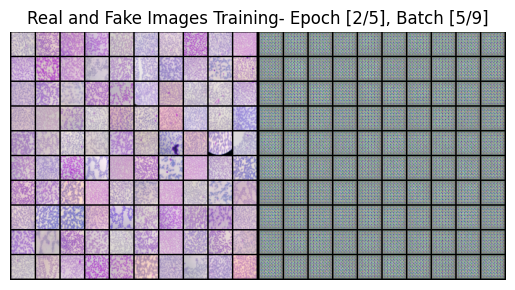

Epoch [2/5], Batch [6/9], Discriminator Loss: 0.1386, Generator Loss: 2.6505 on Training Dataset


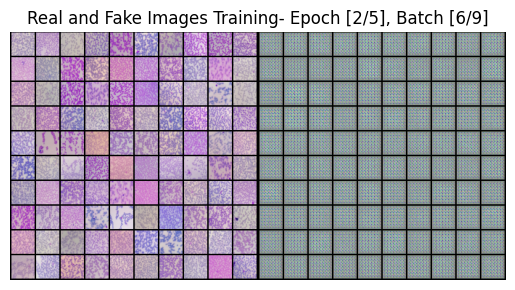

Epoch [2/5], Batch [7/9], Discriminator Loss: 0.1718, Generator Loss: 2.5635 on Training Dataset


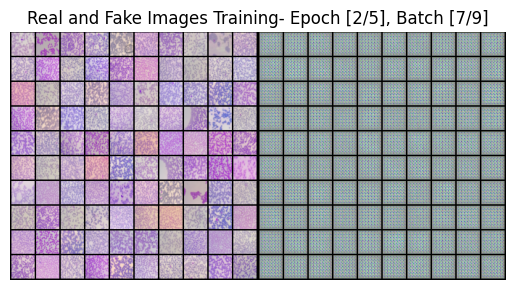

Epoch [2/5], Batch [8/9], Discriminator Loss: 0.1992, Generator Loss: 2.5849 on Training Dataset


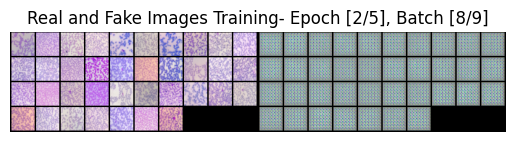

Epoch [2/5], Batch [0/1], Discriminator Loss: 0.1745, Generator Loss: 1.9280 on Validation Dataset


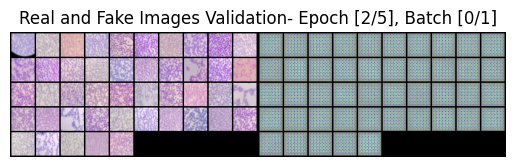

Epoch [3/5], Batch [0/9], Discriminator Loss: 0.1841, Generator Loss: 2.7635 on Training Dataset


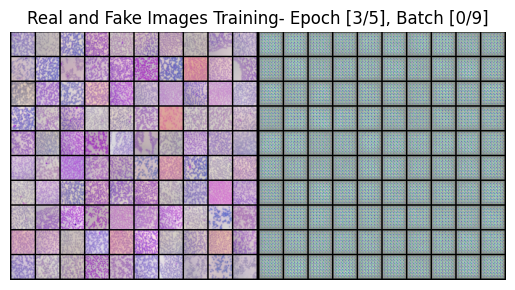

Epoch [3/5], Batch [1/9], Discriminator Loss: 0.1553, Generator Loss: 3.0385 on Training Dataset


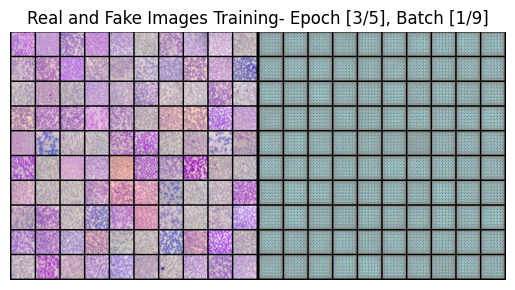

Epoch [3/5], Batch [2/9], Discriminator Loss: 0.1270, Generator Loss: 3.2935 on Training Dataset


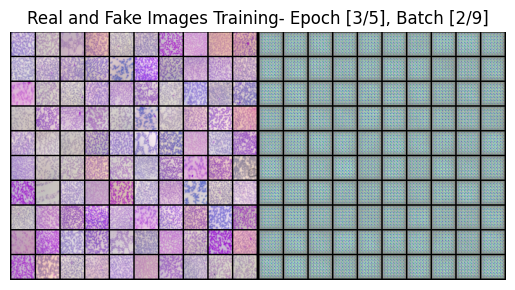

Epoch [3/5], Batch [3/9], Discriminator Loss: 0.1123, Generator Loss: 3.4888 on Training Dataset


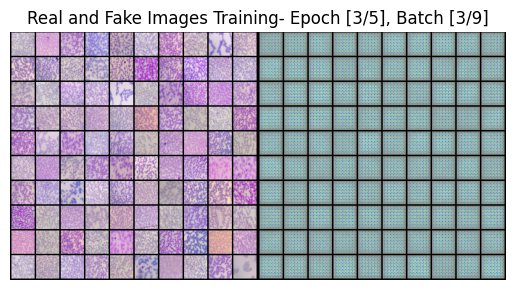

Epoch [3/5], Batch [4/9], Discriminator Loss: 0.1143, Generator Loss: 3.5495 on Training Dataset


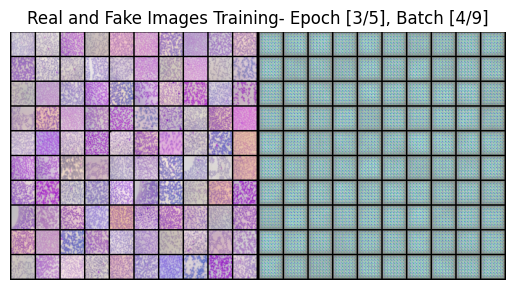

Epoch [3/5], Batch [5/9], Discriminator Loss: 0.1157, Generator Loss: 3.7234 on Training Dataset


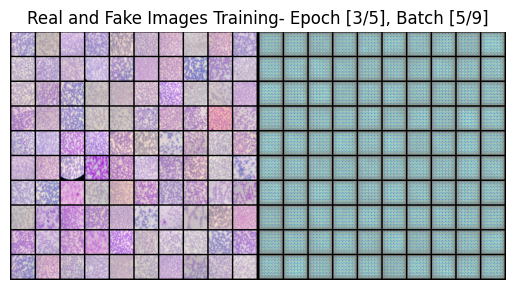

Epoch [3/5], Batch [6/9], Discriminator Loss: 0.1321, Generator Loss: 4.0817 on Training Dataset


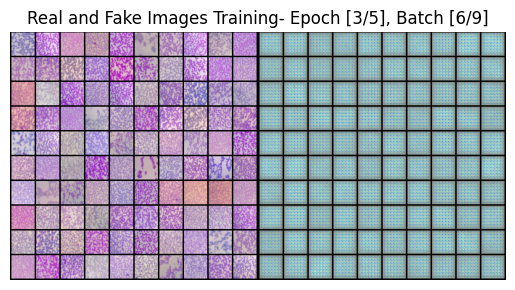

Epoch [3/5], Batch [7/9], Discriminator Loss: 0.1404, Generator Loss: 4.3031 on Training Dataset


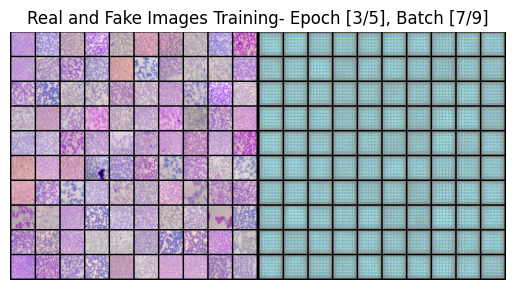

Epoch [3/5], Batch [8/9], Discriminator Loss: 0.1273, Generator Loss: 4.3756 on Training Dataset


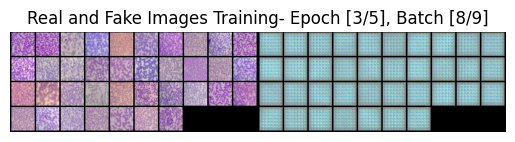

Epoch [3/5], Batch [0/1], Discriminator Loss: 0.1093, Generator Loss: 2.6798 on Validation Dataset


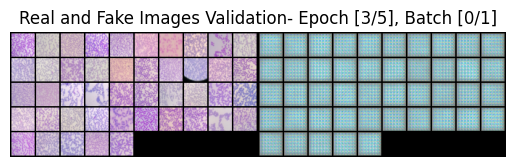

Epoch [4/5], Batch [0/9], Discriminator Loss: 0.1278, Generator Loss: 4.6630 on Training Dataset


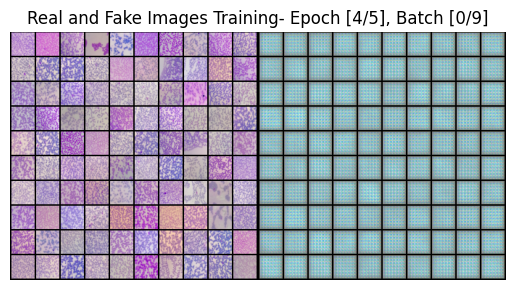

Epoch [4/5], Batch [1/9], Discriminator Loss: 0.1092, Generator Loss: 5.0057 on Training Dataset


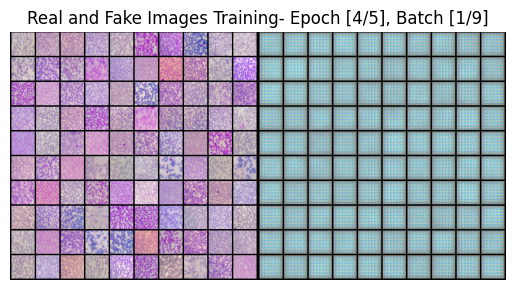

Epoch [4/5], Batch [2/9], Discriminator Loss: 0.1091, Generator Loss: 4.6724 on Training Dataset


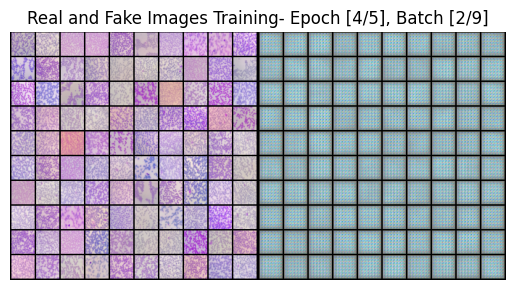

Epoch [4/5], Batch [3/9], Discriminator Loss: 0.1232, Generator Loss: 5.0265 on Training Dataset


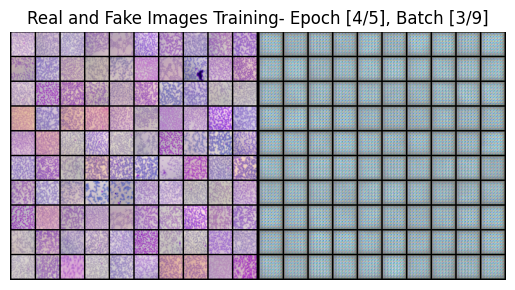

Epoch [4/5], Batch [4/9], Discriminator Loss: 0.1227, Generator Loss: 4.5464 on Training Dataset


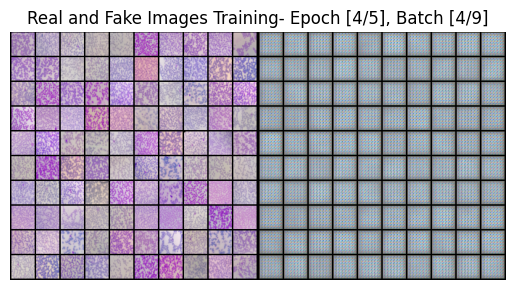

Epoch [4/5], Batch [5/9], Discriminator Loss: 0.1198, Generator Loss: 5.9352 on Training Dataset


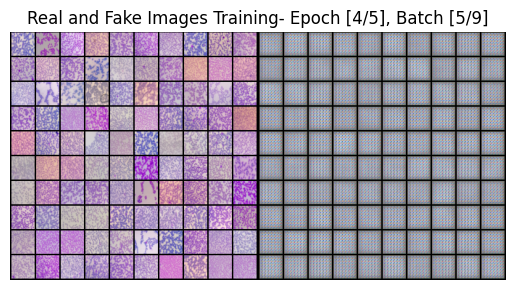

Epoch [4/5], Batch [6/9], Discriminator Loss: 0.1030, Generator Loss: 3.9109 on Training Dataset


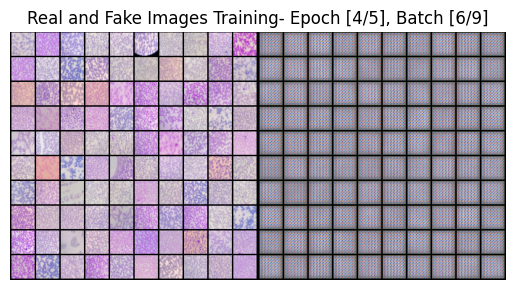

Epoch [4/5], Batch [7/9], Discriminator Loss: 0.2384, Generator Loss: 7.0083 on Training Dataset


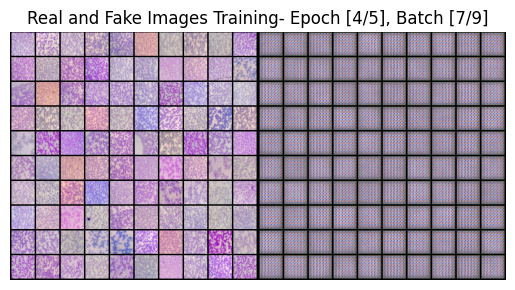

Epoch [4/5], Batch [8/9], Discriminator Loss: 0.4312, Generator Loss: 1.6737 on Training Dataset


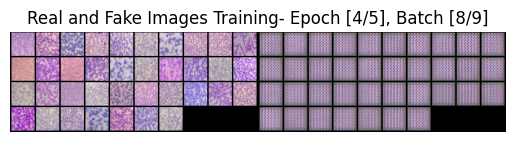

Epoch [4/5], Batch [0/1], Discriminator Loss: 1.4221, Generator Loss: 0.3076 on Validation Dataset


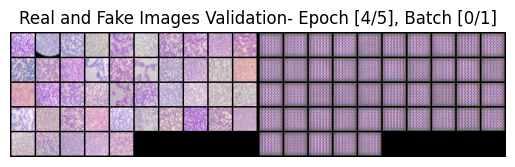

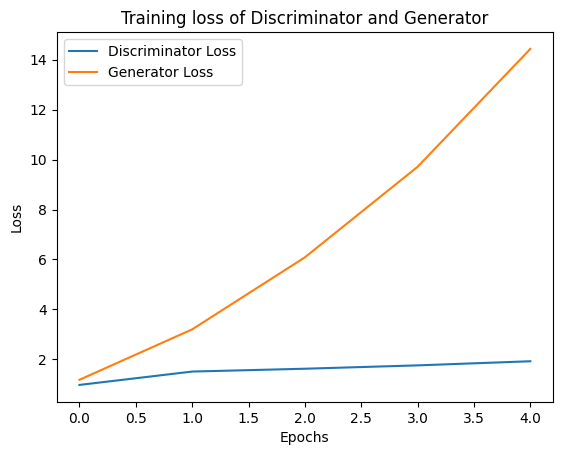

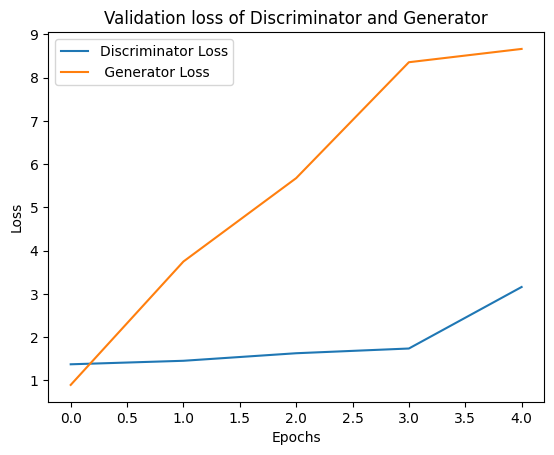

In [43]:
save_interval = 5
disc_losses = []
gen_losses = []
disc_losses_val = []
gen_losses_val = []
i = 0
discriminator_loss = 0.0
generator_loss = 0.0
discriminator_loss_val = 0.0
generator_loss_val = 0.0
for epoch in range(num_epochs):
  for batch_idx, (images) in enumerate(train_loader):
     batch_size = len(images)
     real_labels = torch.ones(batch_size, 1,1,1)
     fake_labels = torch.zeros(batch_size, 1,1,1)
     noise = torch.randn(batch_size, 100, 1, 1)

     optimizer_discriminator.zero_grad()
     real_output = disc(images)
    #  print(real_output)

     real_loss = criterion(real_output, real_labels)
    #  print(real_loss)
     real_loss.backward()


     fake_images = gen(noise)
    #  print(fake_images.size())
     fake_output = disc(fake_images.detach())
     fake_loss = criterion(fake_output,fake_labels)
    #  print(fake_loss)
     fake_loss.backward()

     optimizer_discriminator.step()

     disc_loss = real_loss + fake_loss
    #  print(disc_loss)
     discriminator_loss = discriminator_loss + disc_loss.item()


     optimizer_generator.zero_grad()
     output_fake = disc(fake_images)
     gen_loss = criterion(output_fake, real_labels)

     gen_loss.backward()
     optimizer_generator.step()
     generator_loss = generator_loss+gen_loss.item()


     if i % 100 == 0:
            print(
                f"Epoch [{epoch}/{num_epochs}], Batch [{batch_idx}/{len(train_loader)}], "
                f"Discriminator Loss: {disc_loss.item():.4f}, "
                f"Generator Loss: {gen_loss.item():.4f} on Training Dataset"
            )

     real_grid = torchvision.utils.make_grid(images, nrow=10, normalize=True)

     fake_grid = torchvision.utils.make_grid(fake_images, nrow=10, normalize=True)

     combined_grid = torch.cat((real_grid, fake_grid), dim=2)
     plt.imshow((combined_grid.cpu()).permute(1, 2, 0))
     plt.title(f'Real and Fake Images Training- Epoch [{epoch}/{num_epochs}], Batch [{batch_idx}/{len(train_loader)}]')
     plt.axis('off')
     plt.show()

  train_disc_loss = discriminator_loss/len(train_loader)
  train_gen_loss = generator_loss/len(train_loader)
  disc_losses.append(train_disc_loss)
  gen_losses.append(train_gen_loss)




  # VALIDATION
  disc.eval()
  gen.eval()
  with torch.no_grad():
    for batch_idx, (images) in enumerate(val_loader):
      batch_size = len(images)
      real_labels = torch.ones(batch_size, 1,1,1)
      fake_labels = torch.zeros(batch_size, 1,1,1)
      noise = torch.randn(batch_size, 100, 1, 1)
      real_output = disc(images)

      real_loss = criterion(real_output, real_labels)

      fake_images = gen(noise)

      fake_output = disc(fake_images.detach())
      fake_loss = criterion(fake_output,fake_labels)
      disc_loss = real_loss + fake_loss

      discriminator_loss_val = discriminator_loss_val + disc_loss.item()

      output_fake = disc(fake_images)
      gen_loss = criterion(output_fake, real_labels)
      generator_loss_val = generator_loss_val+gen_loss.item()

      if i % 100 == 0:
        print(
            f"Epoch [{epoch}/{num_epochs}], Batch [{batch_idx}/{len(val_loader)}], "
            f"Discriminator Loss: {disc_loss.item():.4f}, "
            f"Generator Loss: {gen_loss.item():.4f} on Validation Dataset"
        )

      real_grid = torchvision.utils.make_grid(images, nrow=10, normalize=True)

      fake_grid = torchvision.utils.make_grid(fake_images, nrow=10, normalize=True)

      combined_grid = torch.cat((real_grid, fake_grid), dim=2)
      plt.imshow((combined_grid.cpu()).permute(1, 2, 0))
      plt.title(f'Real and Fake Images Validation- Epoch [{epoch}/{num_epochs}], Batch [{batch_idx}/{len(val_loader)}]')
      plt.axis('off')
      plt.show()

  val_disc_loss = discriminator_loss_val/len(val_loader)
  val_gen_loss = generator_loss_val/len(val_loader)
  disc_losses_val.append(val_disc_loss)
  gen_losses_val.append(val_gen_loss)

if (epoch + 1) % save_interval == 0:
      save_path_disc = '/content/drive/MyDrive/DL_ASSIGN_05/GAN_disc_epoch_{}.pth'.format(epoch + 1)
      torch.save(disc.state_dict(), save_path_disc)

      save_path_gen = '/content/drive/MyDrive/DL_ASSIGN_05/GAN_gen_epoch_{}.pth'.format(epoch + 1)
      torch.save(gen.state_dict(), save_path_gen)

# Plotting generator and discriminator losses in a single plot
x_axis = [i for i in range(len(disc_losses))]
plt.plot(x_axis, disc_losses, label='Discriminator Loss')
plt.plot(x_axis, gen_losses, label='Generator Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training loss of Discriminator and Generator')
plt.show()

x_axis = [i for i in range(len(disc_losses_val))]
plt.plot(x_axis, disc_losses_val, label='Discriminator Loss')
plt.plot(x_axis, gen_losses_val, label=' Generator Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Validation loss of Discriminator and Generator')
plt.show()



Batch [0/4], Discriminator Loss: 1.3597, Generator Loss: 0.3232 on Test Dataset


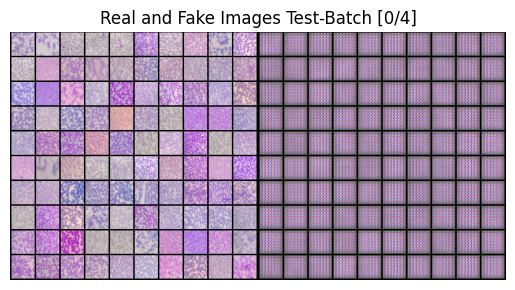

Batch [1/4], Discriminator Loss: 1.4088, Generator Loss: 0.3033 on Test Dataset


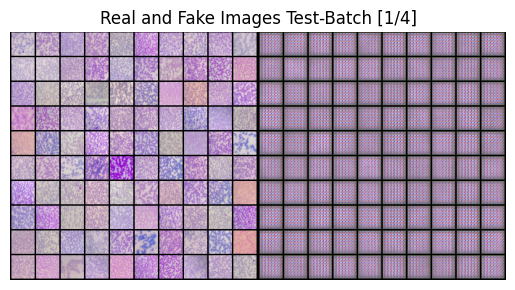

Batch [2/4], Discriminator Loss: 1.4057, Generator Loss: 0.3145 on Test Dataset


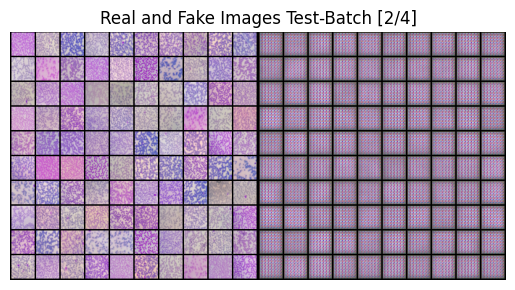

Batch [3/4], Discriminator Loss: 1.3687, Generator Loss: 0.3195 on Test Dataset


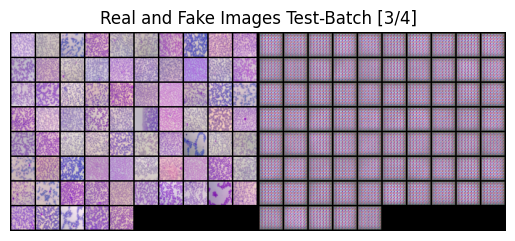

Total loss of discriminator {test_disc_loss} and Total loss of generator {test_gen_loss}


In [45]:
discriminator_loss_test = 0.0
generator_loss_test = 0.0
disc_losses = []
gen_losses = []
disc.eval()
gen.eval()
with torch.no_grad():
  for batch_idx, (images) in enumerate(test_loader):
    batch_size = len(images)
    real_labels = torch.ones(batch_size, 1,1,1)
    fake_labels = torch.zeros(batch_size, 1,1,1)
    noise = torch.randn(batch_size, 100, 1, 1)
    real_output = disc(images)

    real_loss = criterion(real_output, real_labels)

    fake_images = gen(noise)

    fake_output = disc(fake_images.detach())
    fake_loss = criterion(fake_output,fake_labels)
    disc_loss = real_loss + fake_loss

    discriminator_loss_test = discriminator_loss_test + disc_loss.item()

    output_fake = disc(fake_images)
    gen_loss = criterion(output_fake, real_labels)
    generator_loss_test = generator_loss_test+gen_loss.item()

    if i % 100 == 0:
        print(
            f"Batch [{batch_idx}/{len(test_loader)}], "
            f"Discriminator Loss: {disc_loss.item():.4f}, "
            f"Generator Loss: {gen_loss.item():.4f} on Test Dataset"
        )

    real_grid = torchvision.utils.make_grid(images, nrow=10, normalize=True)

    fake_grid = torchvision.utils.make_grid(fake_images, nrow=10, normalize=True)

    combined_grid = torch.cat((real_grid, fake_grid), dim=2)
    plt.imshow((combined_grid.cpu()).permute(1, 2, 0))
    plt.title(f'Real and Fake Images Test-Batch [{batch_idx}/{len(test_loader)}]')
    plt.axis('off')
    plt.show()

test_disc_loss = discriminator_loss_test/len(test_loader)
test_gen_loss = generator_loss_test/len(test_loader)
print(f'Total loss of discriminator {test_disc_loss} and Total loss of generator {test_gen_loss}')
# disc_losses.append(test_disc_loss)
# gen_losses.append(test_gen_loss)

